# Compute Auto correlation in Earthquake counts

dataset -> https://www.kaggle.com/yasserhessein/earthquake-dataset

In [1]:
import pandas as pd

#import the dataset
eq = pd.read_csv(r"C:\Users\jayac\Downloads\archive\database.csv")

eq.head()

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,01/04/1965,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,01/05/1965,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,01/08/1965,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,01/09/1965,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic


In [2]:
#describe the database

eq.describe()

,Latitude,Longitude,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Error,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square
count,23412.000000,23412.000000,23412.000000,4461.000000,7097.000000,23412.000000,327.000000,2564.000000,7299.000000,1604.000000,1156.000000,17352.000000
mean,1.679033,39.639961,70.767911,4.993115,275.364098,5.882531,0.071820,48.944618,44.163532,3.992660,7.662759,1.022784
std,30.113183,125.511959,122.651898,4.875184,162.141631,0.423066,0.051466,62.943106,32.141486,5.377262,10.430396,0.188545
min,-77.080000,-179.997000,-1.100000,0.000000,0.000000,5.500000,0.000000,0.000000,0.000000,0.004505,0.085000,0.000000
25%,-18.653000,-76.349750,14.522500,1.800000,146.000000,5.600000,0.046000,10.000000,24.100000,0.968750,5.300000,0.900000
50%,-3.568500,103.982000,33.000000,3.500000,255.000000,5.700000,0.059000,28.000000,36.000000,2.319500,6.700000,1.000000
75%,26.190750,145.026250,54.000000,6.300000,384.000000,6.000000,0.075500,66.000000,54.000000,4.724500,8.100000,1.130000
max,86.005000,179.998000,700.000000,91.295000,934.000000,9.100000,0.410000,821.000000,360.000000,37.874000,99.000000,3.440000


In [3]:
from pandas_profiling import ProfileReport

eq.profile_report()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
#forecast the number  of strong earthquakes per year

In [17]:

#Convert years to date

eq['Date'] = pd.to_datetime(eq['Date'],utc='true', errors='coerce')

In [18]:
eq['Date'].dtype

datetime64[ns, UTC]

In [19]:
eq['year'] = eq['Date'].dt.year

In [20]:
eq['year']

0        1965
1        1965
2        1965
3        1965
4        1965
         ... 
23407    2016
23408    2016
23409    2016
23410    2016
23411    2016
Name: year, Length: 23412, dtype: int64

In [22]:
#Filter earthquakes with magnitude of 7 or higher

filter_magnitude = eq['Magnitude'] >= 7

data = eq[filter_magnitude]


In [28]:
earthquakes_per_year = data.groupby('year').count()
earthquakes_per_year

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
year,,,,,,,,,,,,,,,,,,,,,
1965,18,18,18,18,18,18,0,0,18,18,...,0,0,0,0,0,18,18,18,18,18
1966,9,9,9,9,9,9,0,0,9,9,...,0,0,0,0,0,9,9,9,9,9
1967,11,11,11,11,11,11,0,0,11,11,...,0,0,0,0,0,11,11,11,11,11
1968,22,22,22,22,22,22,0,0,22,22,...,0,0,0,0,0,22,22,22,22,22
1969,14,14,14,14,14,14,0,0,14,14,...,0,0,0,0,0,14,14,14,14,14
1970,17,17,17,17,17,17,0,0,17,17,...,0,0,0,0,0,17,17,17,17,17
1971,20,20,20,20,20,20,0,0,20,20,...,0,0,0,0,0,20,20,20,20,20
1972,16,16,16,16,16,16,0,0,16,16,...,0,0,0,0,0,16,16,16,16,16
1973,9,9,9,9,9,9,0,0,9,9,...,0,0,0,0,0,9,9,9,9,9


In [29]:
final_data = earthquakes_per_year.iloc[1:-2,0]

In [30]:
final_data

year
1966     9
1967    11
1968    22
1969    14
1970    17
1971    20
1972    16
1973     9
1974    11
1975    13
1976    14
1977    10
1978    12
1979     8
1980     6
1981    11
1982     7
1983    14
1984    14
1985    15
1986    11
1987    13
1988    11
1989     8
1990    18
1991    17
1992    13
1993    12
1994    13
1995    20
1996    15
1997    16
1998    12
1999    18
2000    15
2001    16
2002    13
2003    15
2004    16
2005    11
2006    11
2007    18
2008    12
2009    17
2010    24
2011    20
2012    16
2013    19
2014    12
Name: Date, dtype: int64

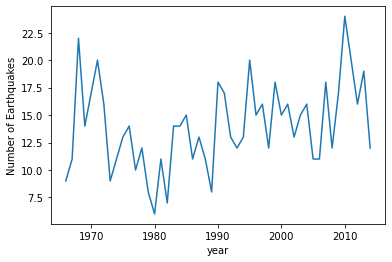

In [38]:
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

# Plotting earthquakes per year

ax = final_data.plot()
ax.set_ylabel('Number of Earthquakes')
plt.show()

In [42]:
shifts = pd.DataFrame(
{
    'this year': final_data,
    'past year': final_data.shift(1)
})

In [43]:
shifts

,this year,past year
year,,
1966,9,NaN
1967,11,9.0
1968,22,11.0
1969,14,22.0
1970,17,14.0
1971,20,17.0
1972,16,20.0
1973,9,16.0
1974,11,9.0


In [44]:
# check for nan
shifts.isna().sum()

this year    0
past year    1
dtype: int64

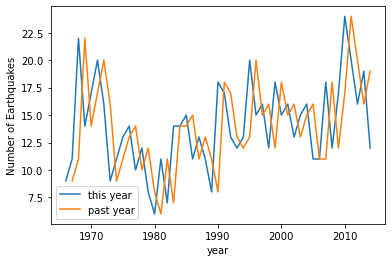

In [45]:
# Plotting earthquakes per year

ax = shifts.plot()
ax.set_ylabel('Number of Earthquakes')
plt.show()

In [48]:
# drop rows with na

shifts = shifts.dropna()

In [49]:
# Compute correlation matrix

shifts.corr()

,this year,past year
this year,1.000000,0.313667
past year,0.313667,1.000000


positive correlation between this year and past year.

#  Stationarity and the ADF Test

In [50]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(final_data)

In [51]:
result

(-5.008806133844326,
 2.1319566272140616e-05,
 0,
 48,
 {'1%': -3.5745892596209488,
  '5%': -2.9239543084490744,
  '10%': -2.6000391840277777},
 202.7529751691226)

In [56]:
p_value = result[1]

#Check stationarity
if p_value < 0.05 :
    print('Series is Stationary')
else :
    print('Series is not Stationary')

Series is Stationary


Two oppososite indicators

 > adfuller test tells that that data is stationary
 
 > autocorrelation is positive ( hypothesis is that this was caused by trend)
 
To be safe, it is better to remove the trend. This can be done by <font color = 'Green'>Differencing</font>.


In [58]:
#Difference the data
differenced_data = final_data.diff().dropna()

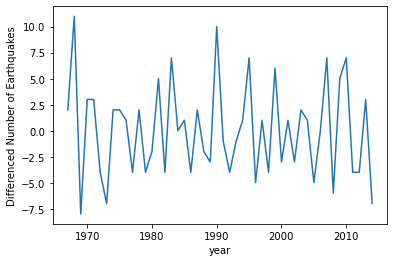

In [59]:
#plot the differenced data
ax = differenced_data.plot()
ax.set_ylabel('Differenced Number of Earthquakes')
plt.show()

In [61]:
shift_diff = pd.DataFrame(
{
    'this year': differenced_data,
    'past year':differenced_data.shift(1)
    
})

In [62]:
shift_diff

,this year,past year
year,,
1967,2.0,NaN
1968,11.0,2.0
1969,-8.0,11.0
1970,3.0,-8.0
1971,3.0,3.0
1972,-4.0,3.0
1973,-7.0,-4.0
1974,2.0,-7.0
1975,2.0,2.0


In [64]:
shift_diff.corr()

,this year,past year
this year,1.000000,-0.376859
past year,-0.376859,1.000000


In [66]:
result = adfuller(differenced_data)
p_value = result[1]

print(result)

#Check stationarity
if p_value < 0.05 :
    print('Series is Stationary')
else :
    print('Series is not Stationary')

(-8.306139012158456, 3.899140527782651e-13, 1, 46, {'1%': -3.5812576580093696, '5%': -2.9267849124681518, '10%': -2.6015409829867675}, 208.62487680780086)
Series is Stationary


## Lags in Auto-Correlation

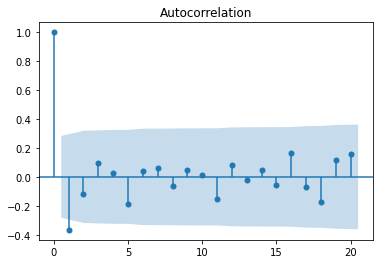

In [69]:
from statsmodels.graphics.tsaplots import plot_acf

plot_acf(differenced_data,lags=20)  # 20 lags means 20 years back in time, be enough to show relevant auto correlation. 
                                    # 40 or even more would be acceptable as well.
plt.show()

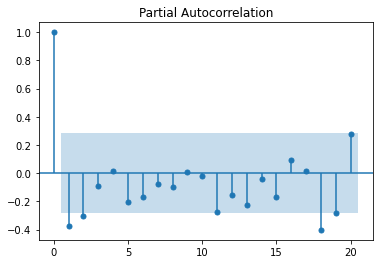

In [70]:
from statsmodels.graphics.tsaplots import plot_pacf

plot_pacf(differenced_data,lags=20)  # 20 lags means 20 years back in time, be enough to show relevant auto correlation. 
                                    # 40 or even more would be acceptable as well.
plt.show()

In [75]:
from statsmodels.regression.linear_model import yule_walker

coeffs,sigma = yule_walker(differenced_data,order = 3)
print('Coefficients: ', -coeffs)
print('Sigma: ', sigma)

Coefficients:  [0.51636104 0.34981679 0.08922855]
Sigma:  3.99051873543974


<font color='blue'> The <b>Coeffs</b> are the coeffs for the last three lagged variables</font>

In [77]:
# Make a list of differenced values

val_list = list(differenced_data)
val_list

[2.0,
 11.0,
 -8.0,
 3.0,
 3.0,
 -4.0,
 -7.0,
 2.0,
 2.0,
 1.0,
 -4.0,
 2.0,
 -4.0,
 -2.0,
 5.0,
 -4.0,
 7.0,
 0.0,
 1.0,
 -4.0,
 2.0,
 -2.0,
 -3.0,
 10.0,
 -1.0,
 -4.0,
 -1.0,
 1.0,
 7.0,
 -5.0,
 1.0,
 -4.0,
 6.0,
 -3.0,
 1.0,
 -3.0,
 2.0,
 1.0,
 -5.0,
 0.0,
 7.0,
 -6.0,
 5.0,
 7.0,
 -4.0,
 -4.0,
 3.0,
 -7.0]

In [85]:
# Reverse the list so that the order corresponds with the order of the coefficients
val_list.reverse()  #performs inplace list reversal


In [87]:
val_list

[-7.0,
 3.0,
 -4.0,
 -4.0,
 7.0,
 5.0,
 -6.0,
 7.0,
 0.0,
 -5.0,
 1.0,
 2.0,
 -3.0,
 1.0,
 -3.0,
 6.0,
 -4.0,
 1.0,
 -5.0,
 7.0,
 1.0,
 -1.0,
 -4.0,
 -1.0,
 10.0,
 -3.0,
 -2.0,
 2.0,
 -4.0,
 1.0,
 0.0,
 7.0,
 -4.0,
 5.0,
 -2.0,
 -4.0,
 2.0,
 -4.0,
 1.0,
 2.0,
 2.0,
 -7.0,
 -4.0,
 3.0,
 3.0,
 -8.0,
 11.0,
 2.0]

In [95]:
#Define the number of years to predict

n_steps = 10
# for each year to predict
for i in range(n_steps):
    print('i = ',i)
   
    #Compute the new value as the sum of lagged values multiplied by their corresponding coeffs
    new_val = 0
    print(' New val = ', new_val)
    for j in range(len(coeffs)):
        new_val += coeffs[j] * val_list[j]
        print(' After computation = ', new_val)
        
    #Insert the new value at the beginning of the list
    val_list.insert(0, new_val)
    print('final new val', new_val)


i =  0
 New val =  0
 After computation =  3.614527253184986
 After computation =  2.5650768777712987
 After computation =  2.921991082652379
final new val 2.921991082652379
i =  1
 New val =  0
 After computation =  -1.5088023431157895
 After computation =  0.9399151995161474
 After computation =  0.6722295458553373
final new val 0.6722295458553373
i =  2
 New val =  0
 After computation =  -0.34711314484146905
 After computation =  -1.3692746910564644
 After computation =  -0.744674832514574
final new val -0.744674832514574
i =  3
 New val =  0
 After computation =  0.3845210681264133
 After computation =  0.1493638850390612
 After computation =  -0.11136114594455895
final new val -0.11136114594455895
i =  4
 New val =  0
 After computation =  0.05750255670893129
 After computation =  0.31800231755677943
 After computation =  0.2580202490926476
final new val 0.2580202490926476
i =  5
 New val =  0
 After computation =  -0.1332316031741362
 After computation =  -0.09427560436813094
 A

In [96]:
val_list

[-0.009038206946507303,
 0.01483089334522207,
 0.020768078953898976,
 -0.06595323110891906,
 -0.027829347932658247,
 0.2580202490926476,
 -0.11136114594455895,
 -0.744674832514574,
 0.6722295458553373,
 2.921991082652379,
 -7.0,
 3.0,
 -4.0,
 -4.0,
 7.0,
 5.0,
 -6.0,
 7.0,
 0.0,
 -5.0,
 1.0,
 2.0,
 -3.0,
 1.0,
 -3.0,
 6.0,
 -4.0,
 1.0,
 -5.0,
 7.0,
 1.0,
 -1.0,
 -4.0,
 -1.0,
 10.0,
 -3.0,
 -2.0,
 2.0,
 -4.0,
 1.0,
 0.0,
 7.0,
 -4.0,
 5.0,
 -2.0,
 -4.0,
 2.0,
 -4.0,
 1.0,
 2.0,
 2.0,
 -7.0,
 -4.0,
 3.0,
 3.0,
 -8.0,
 11.0,
 2.0]

In [97]:
#reverse to have the order of time
val_list.reverse()

In [101]:
#Add the orignal first value back into the lost and do a cumulative sum to undo the differencing
val_list = [final_data.values[0]] + val_list

In [102]:
val_list

[9,
 2.0,
 11.0,
 -8.0,
 3.0,
 3.0,
 -4.0,
 -7.0,
 2.0,
 2.0,
 1.0,
 -4.0,
 2.0,
 -4.0,
 -2.0,
 5.0,
 -4.0,
 7.0,
 0.0,
 1.0,
 -4.0,
 2.0,
 -2.0,
 -3.0,
 10.0,
 -1.0,
 -4.0,
 -1.0,
 1.0,
 7.0,
 -5.0,
 1.0,
 -4.0,
 6.0,
 -3.0,
 1.0,
 -3.0,
 2.0,
 1.0,
 -5.0,
 0.0,
 7.0,
 -6.0,
 5.0,
 7.0,
 -4.0,
 -4.0,
 3.0,
 -7.0,
 2.921991082652379,
 0.6722295458553373,
 -0.744674832514574,
 -0.11136114594455895,
 0.2580202490926476,
 -0.027829347932658247,
 -0.06595323110891906,
 0.020768078953898976,
 0.01483089334522207,
 -0.009038206946507303]

In [103]:
new_val_list = pd.Series(val_list).cumsum()

In [104]:
new_val_list

0      9.000000
1     11.000000
2     22.000000
3     14.000000
4     17.000000
5     20.000000
6     16.000000
7      9.000000
8     11.000000
9     13.000000
10    14.000000
11    10.000000
12    12.000000
13     8.000000
14     6.000000
15    11.000000
16     7.000000
17    14.000000
18    14.000000
19    15.000000
20    11.000000
21    13.000000
22    11.000000
23     8.000000
24    18.000000
25    17.000000
26    13.000000
27    12.000000
28    13.000000
29    20.000000
30    15.000000
31    16.000000
32    12.000000
33    18.000000
34    15.000000
35    16.000000
36    13.000000
37    15.000000
38    16.000000
39    11.000000
40    11.000000
41    18.000000
42    12.000000
43    17.000000
44    24.000000
45    20.000000
46    16.000000
47    19.000000
48    12.000000
49    14.921991
50    15.594221
51    14.849546
52    14.738185
53    14.996205
54    14.968376
55    14.902422
56    14.923190
57    14.938021
58    14.928983
dtype: float64

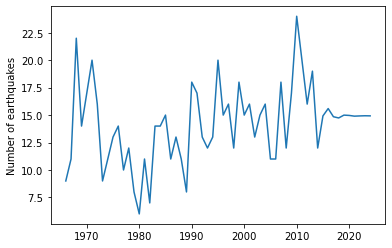

In [105]:
#Plot newly obtained list

plt.plot(range(1966,2025), new_val_list)
plt.ylabel('Number of earthquakes')
plt.show()

In [135]:
coeffs,sigma = yule_walker(differenced_data,order = 20)
print('Coefficients: ', -coeffs)
print('Sigma: ', sigma)

# Make a list of differenced values

val_list = list(differenced_data)
val_list


#trying with order 20
# Make a list of differenced values

val_list = list(differenced_data)
val_list

# Reverse the list so that the order corresponds with the order of the coefficients
val_list.reverse()  #performs inplace list reversal

#Define the number of years to predict

n_steps = 10
# for each year to predict
for i in range(n_steps):
    print('i = ',i)
   
    #Compute the new value as the sum of lagged values multiplied by their corresponding coeffs
    new_val = 0
    print(' New val = ', new_val)
    for j in range(len(coeffs)):
        new_val += coeffs[j] * val_list[j]
        print(' After computation = ', new_val)
        
    #Insert the new value at the beginning of the list
    val_list.insert(0, new_val)
    print('final new val', new_val)


Coefficients:  [ 0.68210038  0.43671608  0.32622505  0.37607963  0.58250524  0.62416276
  0.52116694  0.45871818  0.30395538  0.42149383  0.61219884  0.49615822
  0.47069342  0.19908551  0.15957736  0.11795781  0.27713538  0.4186792
  0.07111315 -0.27725021]
Sigma:  2.9246606275568103
i =  0
 New val =  0
 After computation =  4.7747026604238965
 After computation =  3.464554426679771
 After computation =  4.769454616472471
 After computation =  6.273773151639391
 After computation =  2.19623645186282
 After computation =  -0.9245773692442136
 After computation =  2.2024242989360574
 After computation =  -1.0086029484125727
 After computation =  -1.0086029484125727
 After computation =  1.0988662023753508
 After computation =  0.4866673587720455
 After computation =  -0.50564907405003
 After computation =  0.9064311766385739
 After computation =  0.7073456653838583
 After computation =  1.1860777480376081
 After computation =  0.4783308683704688
 After computation =  1.5868723857972806

In [136]:
#reverse to have the order of time
val_list.reverse()

#Add the orignal first value back into the lost and do a cumulative sum to undo the differencing
val_list = [final_data.values[0]] + val_list

new_val_list = pd.Series(val_list).cumsum()


In [137]:
new_val_list

0      9.000000
1     11.000000
2     22.000000
3     14.000000
4     17.000000
5     20.000000
6     16.000000
7      9.000000
8     11.000000
9     13.000000
10    14.000000
11    10.000000
12    12.000000
13     8.000000
14     6.000000
15    11.000000
16     7.000000
17    14.000000
18    14.000000
19    15.000000
20    11.000000
21    13.000000
22    11.000000
23     8.000000
24    18.000000
25    17.000000
26    13.000000
27    12.000000
28    13.000000
29    20.000000
30    15.000000
31    16.000000
32    12.000000
33    18.000000
34    15.000000
35    16.000000
36    13.000000
37    15.000000
38    16.000000
39    11.000000
40    11.000000
41    18.000000
42    12.000000
43    17.000000
44    24.000000
45    20.000000
46    16.000000
47    19.000000
48    12.000000
49    15.464510
50    13.633233
51    13.136600
52    13.756342
53    17.824000
54    13.617231
55    13.403242
56    14.130891
57    16.599644
58    15.729776
dtype: float64

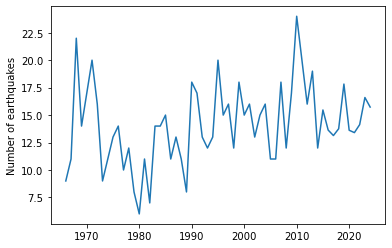

In [139]:
#Plot newly obtained list

plt.plot(range(1966,2025),new_val_list)
plt.ylabel('Number of earthquakes')
plt.show()